In [1]:
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import os
import sys
import re
import pandas as pd 
import glob
import scipy
import scipy.io
from collections import Counter
import scanpy as sc
import gseapy as gp
import h5py
import louvain
import harmonypy as hm
import scrublet as scr
from matplotlib import rcParams
rcParams['figure.figsize'] = 12,12
file_figs = ''
from methods import *
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)
sc.settings.figdir = '../figures/ec_subtypes/'

-----
anndata     0.7.4
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 8.0.0
anndata             0.7.4
appdirs             1.4.4
backcall            0.2.0
bioservices         1.7.9
brotli              NA
bs4                 4.9.1
cairo               1.19.1
certifi             2020.12.05
cffi                1.14.0
chardet             3.0.4
colorama            0.4.3
colorlog            NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.2
docutils            0.16
easydev             0.10.1
get_version         2.1
google              NA
gseapy              0.10.1
h5py                2.10.0
harmonypy           NA
html5lib            1.1
idna                2.10
igraph              0.8.2
ipykernel           5.3.4
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.17.2
joblib              0.16.0
kiwisolver          1.2.0
legacy_api_wrap     1.2
leidenalg           0.8.2
llvmlite            0.34.0
louvain

-----
anndata     0.7.4
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 8.0.0
anndata             0.7.4
appdirs             1.4.4
attr                20.3.0
backcall            0.2.0
bioservices         1.7.9
brotli              NA
bs4                 4.9.1
cairo               1.19.1
certifi             2020.12.05
cffi                1.14.0
chardet             3.0.4
colorama            0.4.3
colorlog            NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.2
docutils            0.16
easydev             0.10.1
get_version         2.1
google              NA
gseapy              0.10.1
h5py                2.10.0
harmonypy           NA
html5lib            1.1
idna                2.10
igraph              0.8.2
ipykernel           5.3.4
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.17.2
jinja2              2.11.2
joblib              0.16.0
jsonschema          3.2.0
kiwisolver          1.2.0
lega

/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


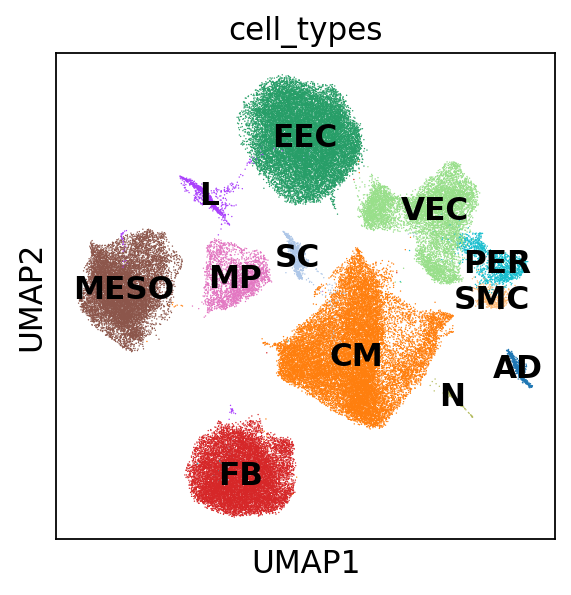

In [2]:
%matplotlib inline
from matplotlib import rcParams
rcParams['figure.figsize'] = 12,12
file_figs = ''
from methods import *
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)
sc.settings.figdir = '../figures/M2_cell_type/'

adata = sc.read_h5ad("../h5ad/celltypes_60_6000_500_0.1.h5ad")
print(adata)
sc.pl.umap(adata, color = 'cell_types', legend_loc = 'on data')

In [3]:
sc.tl.rank_genes_groups(adata, 'cell_types', method='wilcoxon', n_genes = 1000)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:27)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns["dendrogram_['cell_types']"]`
categories: AD, CM, EEC, etc.
var_group_labels: L


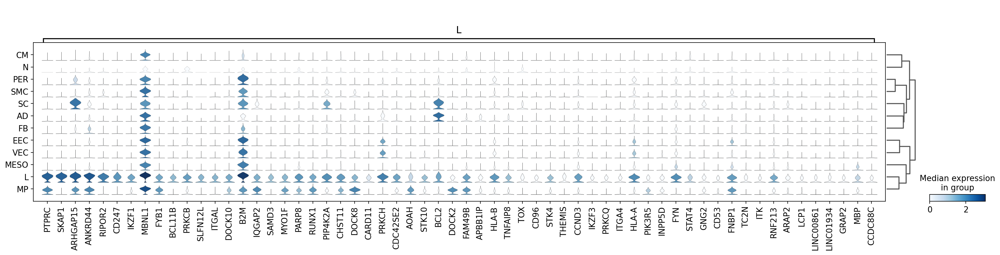

In [4]:
sc.pl.rank_genes_groups_stacked_violin(adata, groupby = "cell_types", n_genes = 60, groups = ["L"], dendrogram = True)

In [5]:
adata.obs.cell_types = adata.obs.cell_types.cat.reorder_categories(["L", "MP", "MESO", "EEC", "VEC", "FB", "AD", "SC", "SMC", "PER", "N", "CM"])

/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


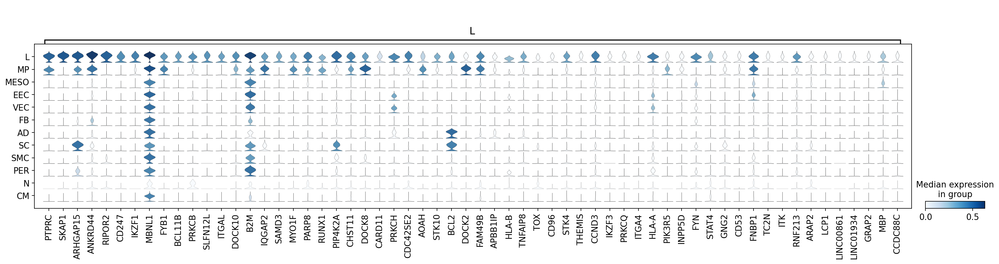

In [6]:
sc.pl.rank_genes_groups_stacked_violin(adata, groupby = "cell_types", n_genes = 60, groups = ["L"], dendrogram = False, standard_scale = "var")

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    558 total control genes are used. (0:00:02)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    602 total control genes are used. (0:00:02)
-->     'phase', cell cycle phase (adata.obs)


/home/schmauch/data/conda/envs/project2/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'phase' as categorical


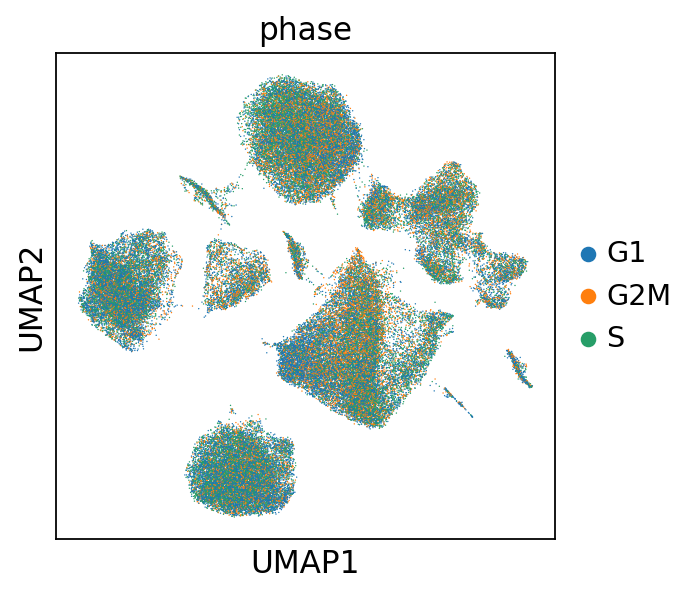

In [3]:
cell_cycle_genes = [x.strip() for x in open('../data/regev_lab_cell_cycle_genes.txt')]

s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]

sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

adata.obs.phase.value_counts()

sc.pl.umap(adata, color = 'phase')

In [4]:
adata.obs

,n_genes,percent_mito,n_counts,doublet_score,batch,sample_id,phenotype,leiden,cell_types,S_score,G2M_score,phase
cell_1_13-0,1110,0.099585,1687.0,0.070015,1,1,CAD,4,CM,0.059872,-0.030990,S
cell_1_14-0,995,0.102985,1340.0,0.072449,1,1,CAD,0,FB,-0.052022,-0.015906,G1
cell_1_15-0,1135,0.094244,1581.0,0.030474,1,1,CAD,0,FB,0.137471,0.073805,S
cell_1_16-0,1179,0.064593,1672.0,0.021225,1,1,CAD,0,FB,-0.042898,-0.048418,G1
cell_1_26-0,1037,0.077736,1608.0,0.083453,1,1,CAD,3,CM,-0.029453,0.021337,G2M
...,...,...,...,...,...,...,...,...,...,...,...,...
cell_174_10086-12,2050,0.143857,4143.0,0.041025,3,174,HF_Congestive,4,CM,0.009659,-0.023706,S
cell_174_10087-12,3274,0.079461,7790.0,0.054911,3,174,HF_Congestive,2,MESO,-0.016740,-0.022008,G1
cell_174_10089-12,2118,0.011379,3779.0,0.028820,3,174,HF_Congestive,2,MESO,-0.052003,-0.024523,G1
cell_174_10092-12,2405,0.062819,4314.0,0.028820,3,174,HF_Congestive,1,EEC,0.009158,0.063907,G2M


/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


AnnData object with n_obs × n_vars = 780 × 33538
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'sample_id', 'phenotype', 'leiden', 'cell_types', 'S_score', 'G2M_score', 'phase', 'old_leiden'
    var: 'gene_ids', 'feature_types', 'genome'
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


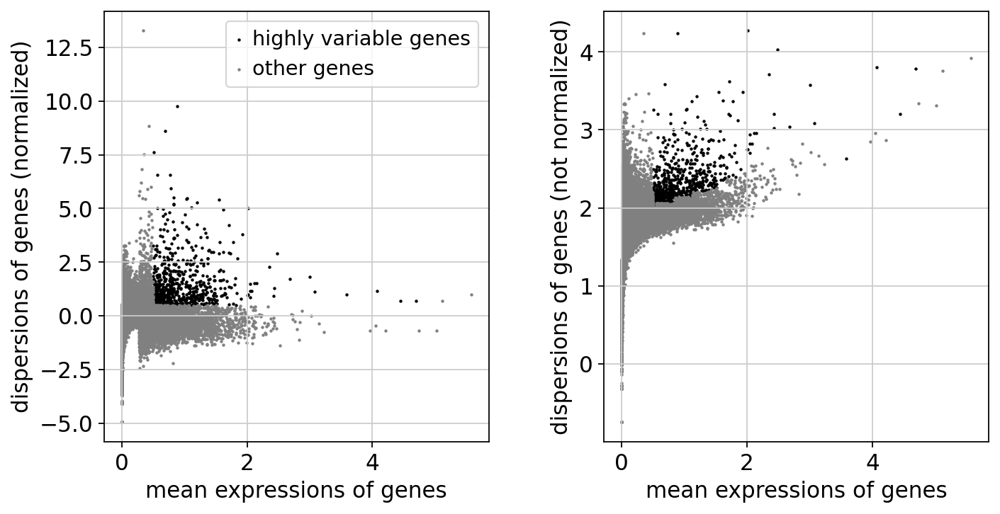

View of AnnData object with n_obs × n_vars = 780 × 707
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'sample_id', 'phenotype', 'leiden', 'cell_types', 'S_score', 'G2M_score', 'phase', 'old_leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg'
AnnData object with n_obs × n_vars = 555 × 692
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'sample_id', 'phenotype', 'leiden', 'cell_types', 'S_score', 'G2M_score', 'phase', 'old_leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'rps', 'rpl', 'mt', 'mean', 'std'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'old_leiden_colors', 'batch_colors', 'sample_id_colors', "dendrogram_['leiden']", 'dendrogram_leiden', 'phenotype_colors', 'phase_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'dis

Trying to set attribute `.var` of view, copying.


View of AnnData object with n_obs × n_vars = 780 × 692
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'sample_id', 'phenotype', 'leiden', 'cell_types', 'S_score', 'G2M_score', 'phase', 'old_leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'rps', 'rpl', 'mt'
    uns: 'hvg'
regressing out ['n_counts', 'percent_mito']


/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished (0:00:01)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


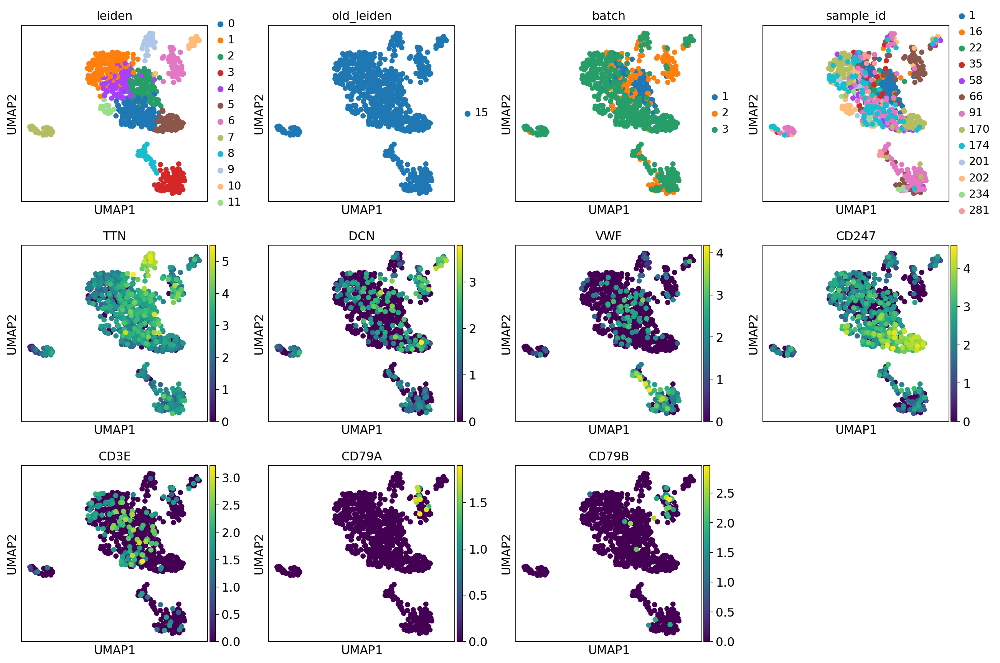

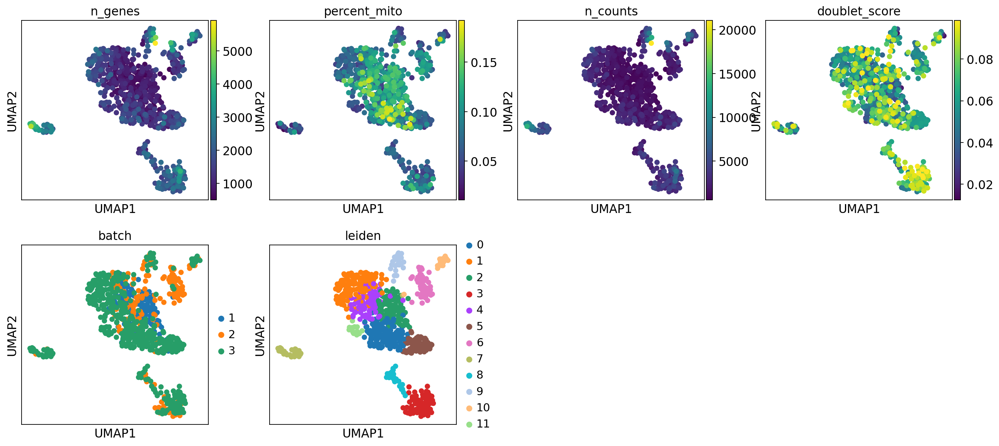

In [27]:
adata.obs['old_leiden'] = adata.obs.leiden
subadata2 = adata[adata.obs.cell_types.isin(['L'])]
subraw = sc.AnnData(subadata2.raw.X.toarray(), var = subadata2.raw.var, obs = subadata2.obs)
print(subraw)
sc.pp.highly_variable_genes(subraw, min_mean=0.5, max_mean=5, min_disp=0.5)
rcParams['figure.figsize'] = 5,5
sc.pl.highly_variable_genes(subraw)
subraw.raw = subraw
subraw = subraw[:, subraw.var.highly_variable]
print(subraw)
subadata2 = subraw
print(subadata)

subadata2.var['rps'] = subadata2.var_names.str.startswith('RPS')
subadata2.var['rpl'] = subadata2.var_names.str.startswith('RPL')
subadata2.var['mt'] = subadata2.var_names.str.startswith('MT-')


subadata2 = subadata2[:,~(subadata2.var['mt'] | subadata2.var['rps'] | subadata2.var['rpl'])]
#subadata2 = subadata2[:,subadata2.var.index.isin(subraw.var.index)]
print(subadata2)
sc.pp.regress_out(subadata2, ['n_counts', 'percent_mito'])
sc.pp.scale(subadata2, max_value=10)
sc.tl.pca(subadata2, svd_solver='arpack')
#ho = hm.run_harmony(subadata2.obsm['X_pca'], subadata2.obs, "sample_id", max_iter_kmeans=50)
#subadata2.obsm['X_pca'] = ho.Z_corr.T
sc.pp.neighbors(subadata2, n_neighbors=10, n_pcs=40)
sc.tl.umap(subadata2)
sc.tl.leiden(subadata2, resolution = 1)
rcParams['figure.figsize'] = 4,4
sc.pl.umap(subadata2, color=['leiden', 'old_leiden', 'batch', 'sample_id', 'TTN', 'DCN', 'VWF', 
                             'CD247', 'CD3E', 'CD79A', 'CD79B'])
sc.pl.umap(subadata2, color = ['n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'leiden'])

    using 'X_pca' with n_pcs = 30
Storing dendrogram info using `.uns["dendrogram_['leiden']"]`
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


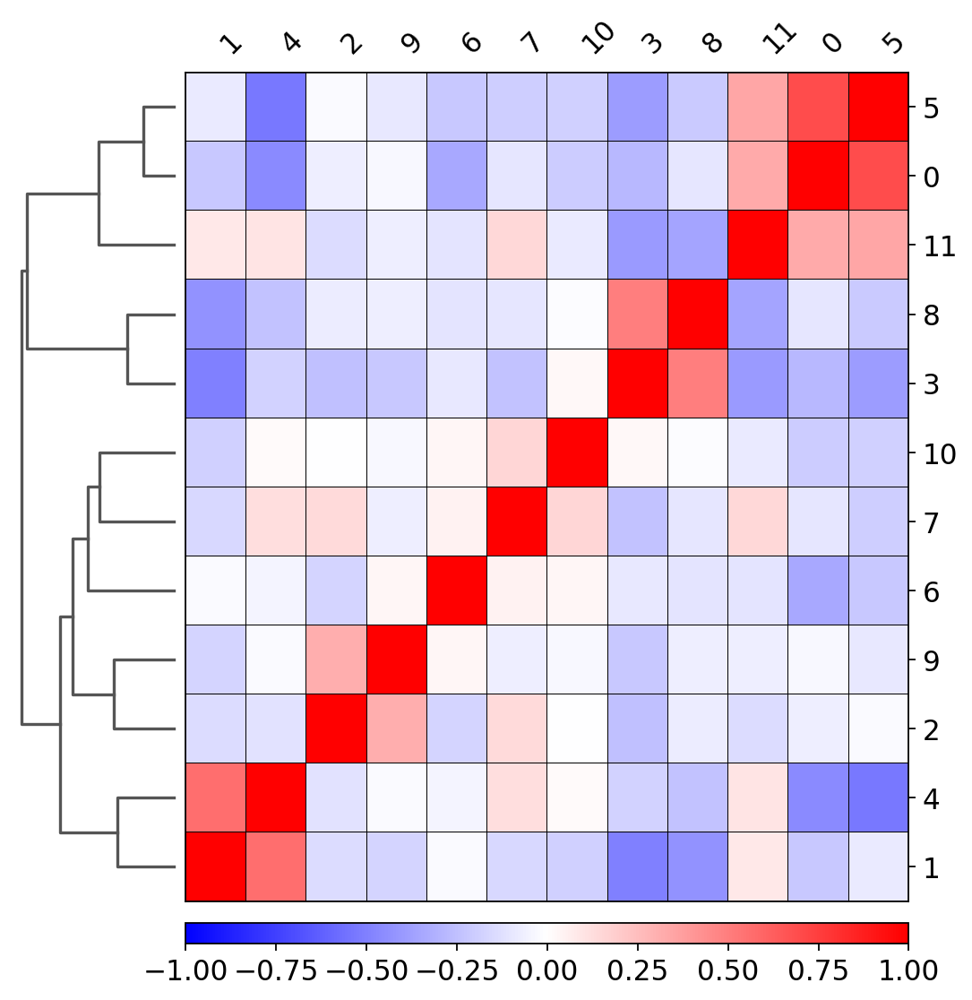

/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


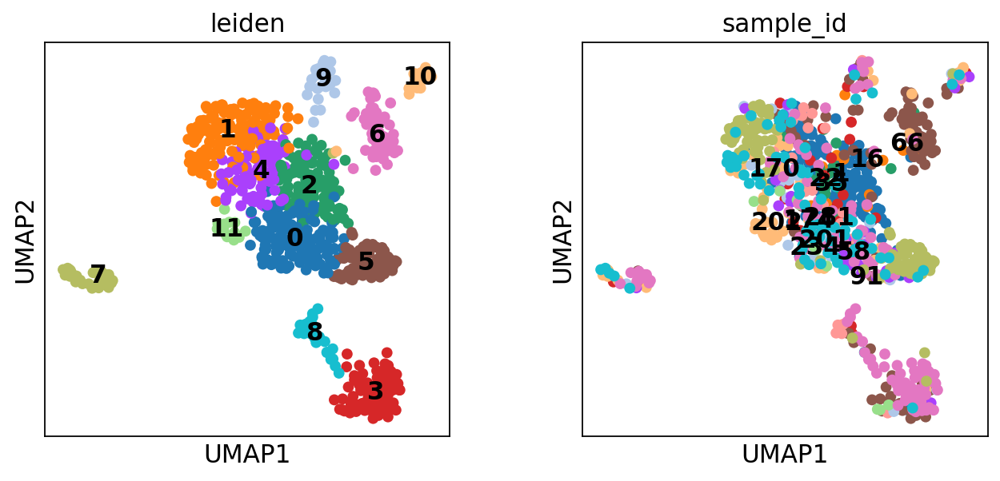

In [29]:
sc.tl.dendrogram(subadata, 'leiden', n_pcs=30)
ax = sc.pl.correlation_matrix(subadata, 'leiden', figsize = (8,8))
sc.pl.umap(subadata, color = ['leiden', 'sample_id'], legend_loc = 'on data')

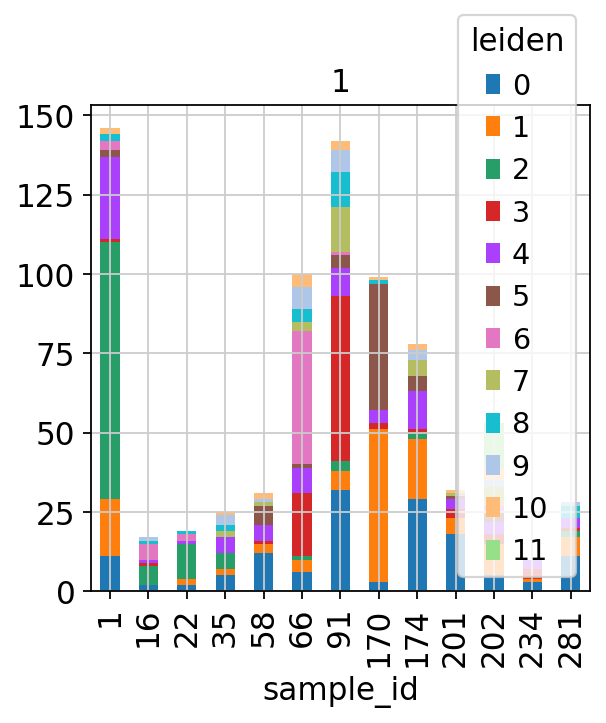

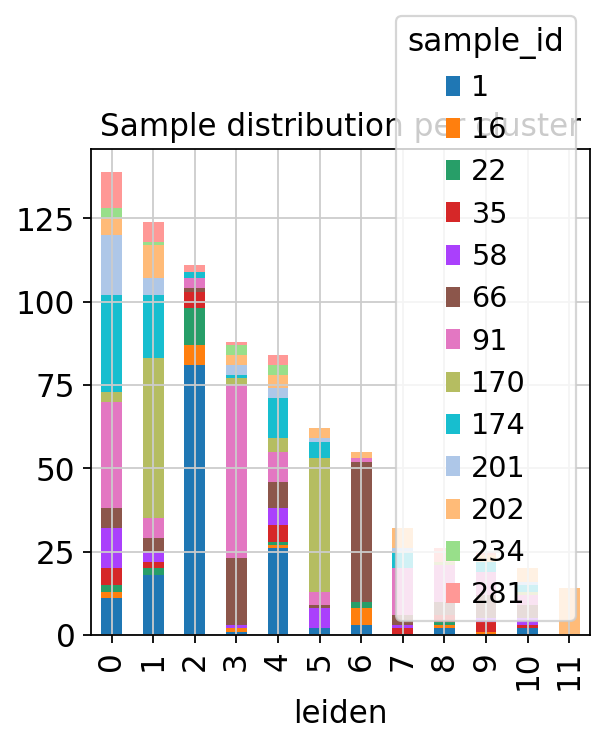

In [30]:
test = subadata.obs.groupby(['leiden','sample_id']).size().unstack(fill_value=0)
test.columns = test.columns.astype('str')
#test.insert(0, "All", test.sum(axis = 1), True)
test.T.plot.bar(stacked=True, title="1");
test.plot.bar(stacked=True, title="Sample distribution per cluster");

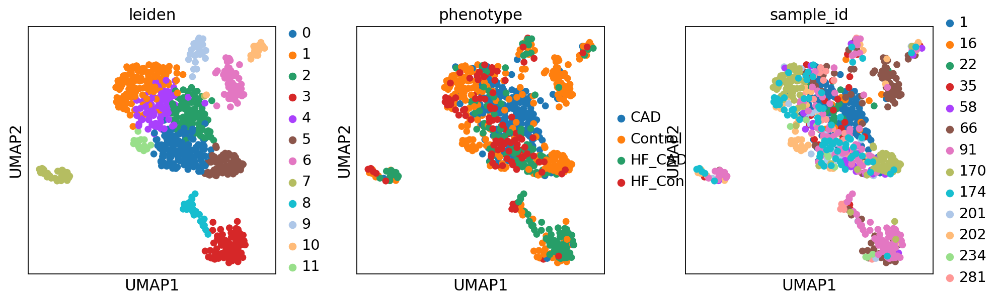

In [31]:
sc.pl.umap(subadata, color = ['leiden', 'phenotype', 'sample_id'])

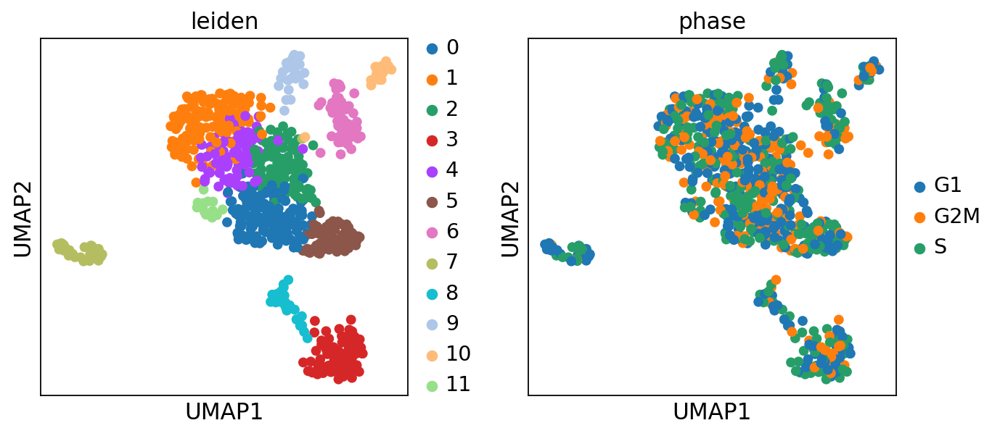

In [32]:
sc.pl.umap(subadata, color = ['leiden', 'phase'])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


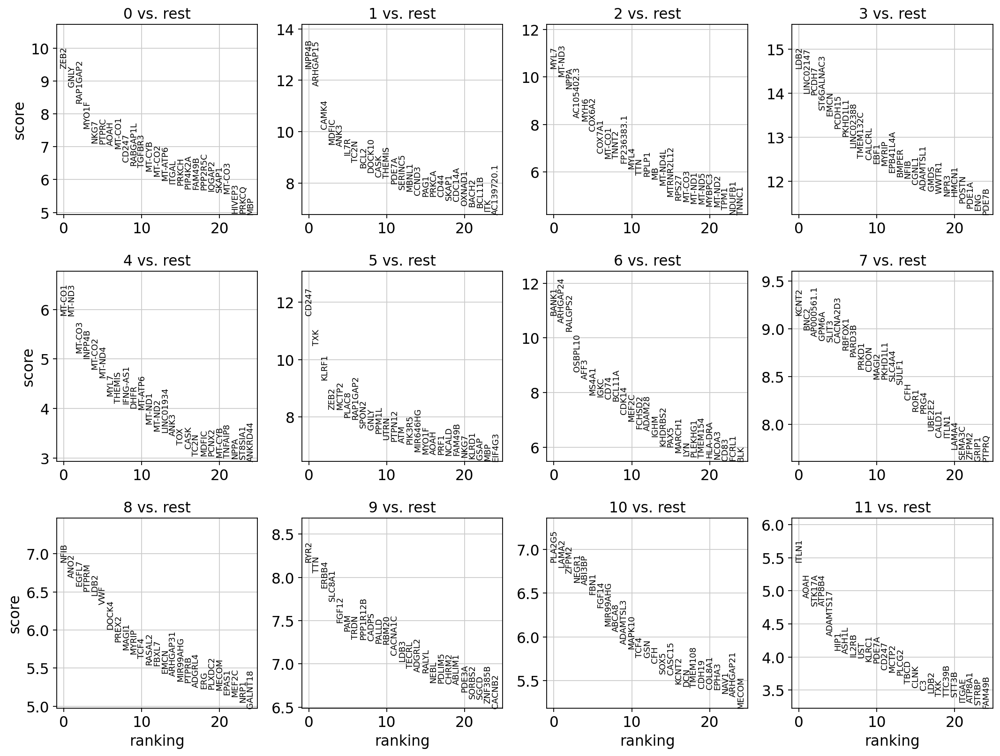

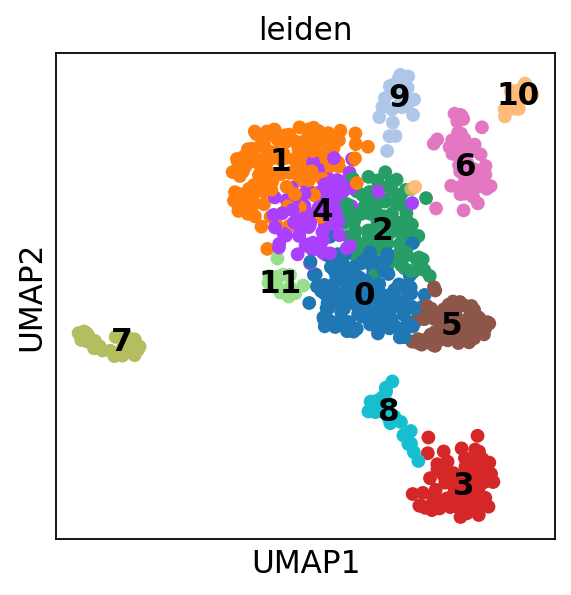

,0,1,2,3,4,5,6,7,8,9,10,11
0,ZEB2,INPP4B,MYL7,LDB2,MT-CO1,CD247,BANK1,KCNT2,NFIB,RYR2,PLA2G5,ITLN1
1,GNLY,ARHGAP15,MT-ND3,LINC02147,MT-ND3,TXK,ARHGAP24,BNC2,ANO2,TTN,LAMA2,AOAH
2,RAP1GAP2,CAMK4,NPPA,PCDH7,MT-CO3,KLRF1,RALGPS2,AP000561.1,EGFL7,ERBB4,ZFPM2,STK17A
3,MYO1F,MDFIC,AC105402.3,ST6GALNAC3,INPP4B,ZEB2,OSBPL10,GPM6A,PTPRM,SLC8A1,NEGR1,ATP8B4
4,NKG7,ANK3,MYH6,EMCN,MT-CO2,MCTP2,AFF3,SLIT3,LDB2,FGF12,ABI3BP,ADAMTS17
5,PTPRC,IL7R,COX6A2,PCDH15,MT-ND4,PLAC8,MS4A1,CACNA2D3,VWF,PAM,FBN1,HIP1
6,AOAH,TC2N,COX7A1,PKHD1L1,MYL7,RAP1GAP2,IGKC,RBFOX1,DOCK4,TRDN,FGF14,ASH1L
7,MT-CO1,BCL2,MT-CO1,LINC02388,THEMIS,SPON2,CD74,PARD3B,PREX2,PPP1R12B,MIR99AHG,IL2RB
8,CD247,DOCK10,TNNT2,TMEM132C,IFNG-AS1,GNLY,BCL11A,PRKD1,MAGI1,CADPS,ABCA8,UST
9,RABGAP1L,CASK,FP236383.1,CALCRL,DHFR,PPM1L,CDK14,CDON,MYRIP,PALLD,ADAMTSL3,KLRC1


In [33]:
sc.tl.rank_genes_groups(subadata, 'leiden', method='wilcoxon', n_genes = 1000)
sc.pl.rank_genes_groups(subadata, n_genes=25, sharey=False)

sc.pl.umap(subadata, color = 'leiden', legend_loc = 'on data')

pd.DataFrame(subadata.uns['rank_genes_groups']['names']).head(25)

/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


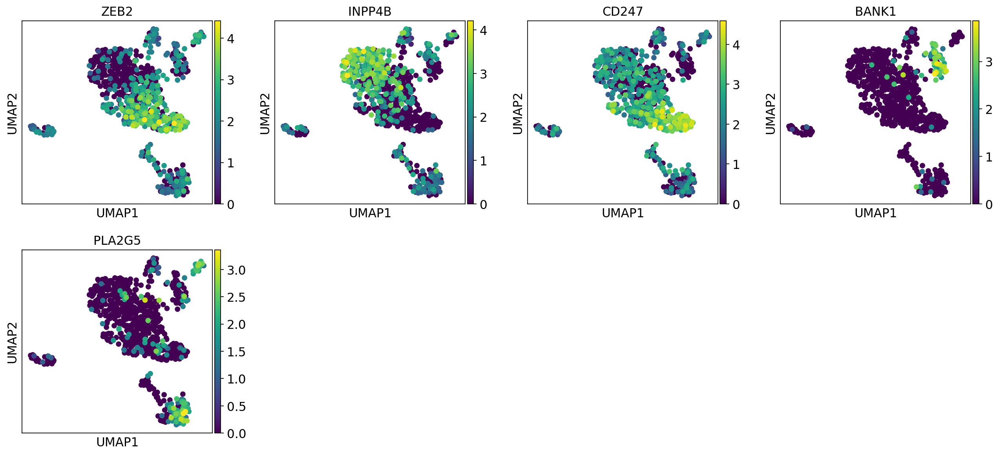

In [34]:
sc.pl.umap(subadata, color = ['ZEB2', 'INPP4B', 'CD247', 'BANK1', 'PLA2G5'])

/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


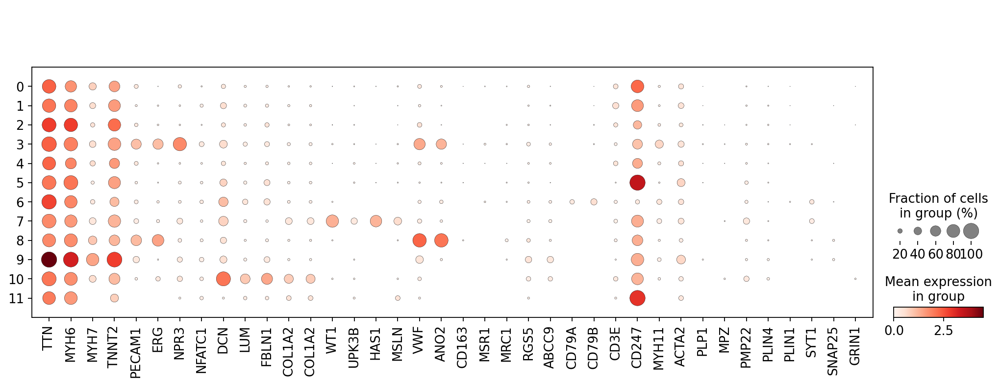

In [36]:
markers_all = ["TTN", "MYH6", "MYH7", "TNNT2", 
               "PECAM1", "ERG",
               "NPR3", "NFATC1", 
               "DCN", "LUM", "FBLN1", "COL1A2", "COL1A2",
               'WT1', 'UPK3B', 'HAS1', 'MSLN',
               "VWF", "ANO2",
               "CD163", "MSR1", "MRC1", 
               "RGS5", "ABCC9",
               'CD79A', 'CD79B', 'CD3E', 'CD247',
               "MYH11", "ACTA2",
               'PLP1', 'MPZ', 'PMP22',
               "PLIN4", "PLIN1",
               'SYT1', 'SNAP25', 'GRIN1']
sc.pl.dotplot(subadata, markers_all, groupby = 'leiden')

In [37]:
subadata2 = subadata[~subadata.obs.leiden.isin(["2", "3", "7", "8", "9", "10"])]

/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


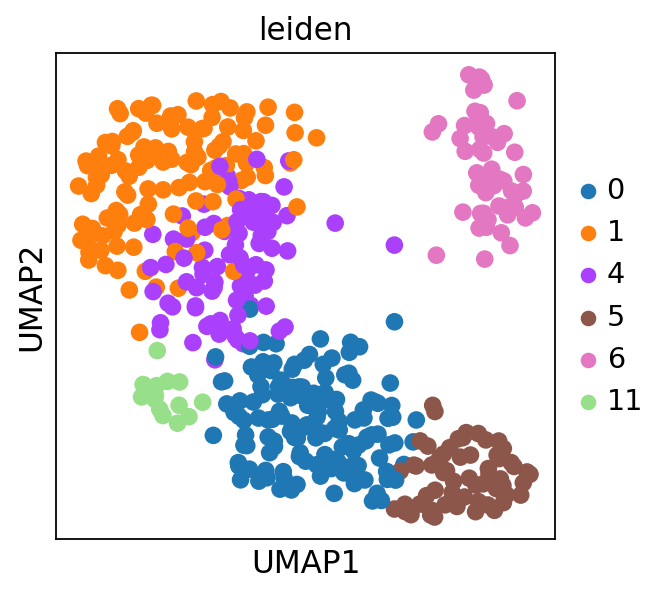

In [38]:
sc.pl.umap(subadata2, color = 'leiden')

In [39]:
subadata3 = subadata2.copy()

AnnData object with n_obs × n_vars = 478 × 33538
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'sample_id', 'phenotype', 'leiden', 'cell_types', 'S_score', 'G2M_score', 'phase', 'old_leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


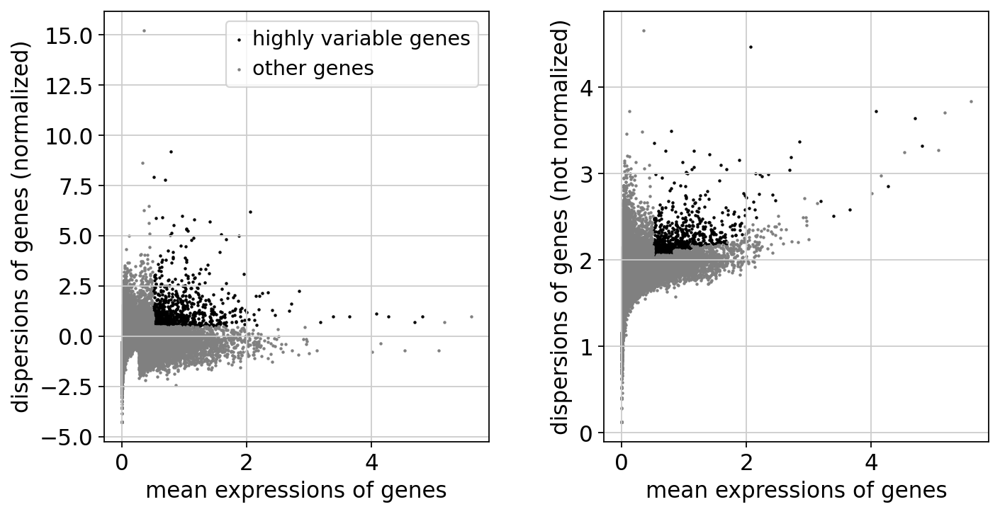

/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


View of AnnData object with n_obs × n_vars = 478 × 781
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'sample_id', 'phenotype', 'leiden', 'cell_types', 'S_score', 'G2M_score', 'phase', 'old_leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg'
AnnData object with n_obs × n_vars = 780 × 692
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'sample_id', 'phenotype', 'leiden', 'cell_types', 'S_score', 'G2M_score', 'phase', 'old_leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'rps', 'rpl', 'mt', 'mean', 'std'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'old_leiden_colors', 'batch_colors', 'sample_id_colors', "dendrogram_['leiden']", 'dendrogram_leiden', 'phenotype_colors', 'phase_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'dis

Trying to set attribute `.var` of view, copying.


View of AnnData object with n_obs × n_vars = 478 × 762
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'sample_id', 'phenotype', 'leiden', 'cell_types', 'S_score', 'G2M_score', 'phase', 'old_leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'rps', 'rpl', 'mt'
    uns: 'hvg'
regressing out ['n_counts', 'percent_mito']
    finished (0:00:01)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


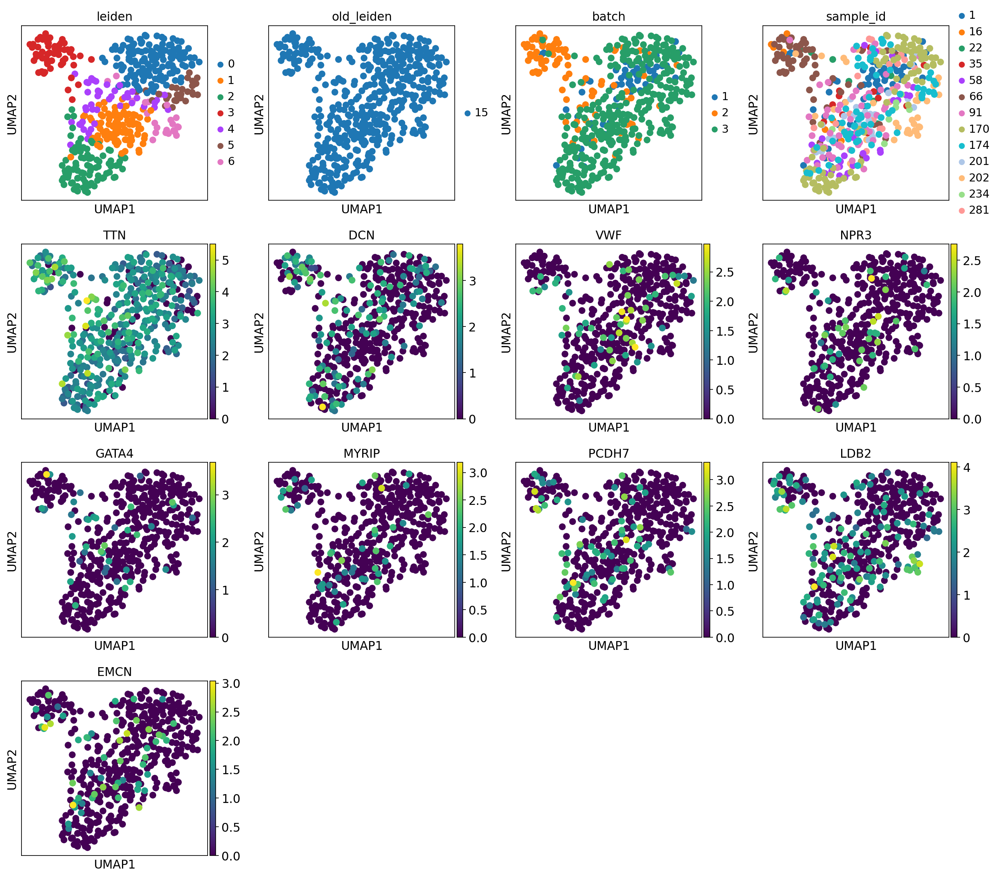

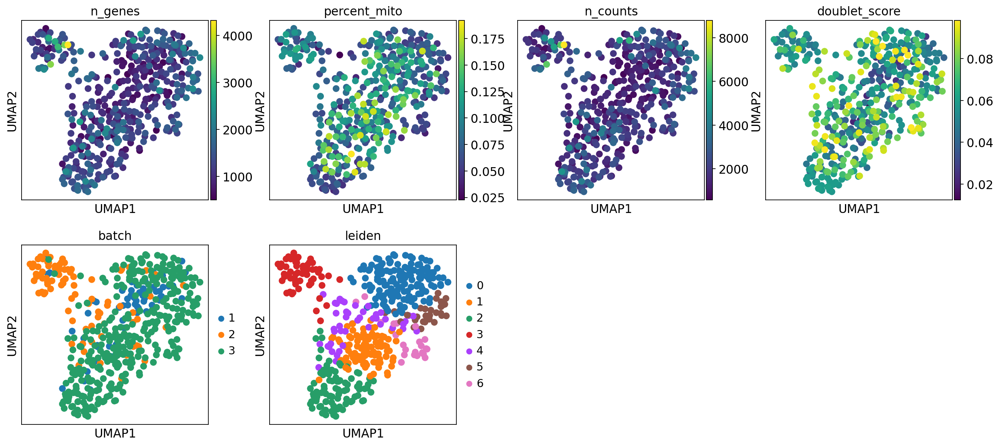

In [45]:
subraw = sc.AnnData(subadata2.raw.X, var = subadata2.raw.var, obs = subadata2.obs)
print(subraw)
sc.pp.highly_variable_genes(subraw, min_mean=0.5, max_mean=5, min_disp=0.5)
rcParams['figure.figsize'] = 5,5
sc.pl.highly_variable_genes(subraw)
subraw.raw = subraw
subraw = subraw[:, subraw.var.highly_variable]
print(subraw)
subadata2 = subraw
print(subadata)

subadata2.var['rps'] = subadata2.var_names.str.startswith('RPS')
subadata2.var['rpl'] = subadata2.var_names.str.startswith('RPL')
subadata2.var['mt'] = subadata2.var_names.str.startswith('MT-')


subadata2 = subadata2[:,~(subadata2.var['mt'] | subadata2.var['rps'] | subadata2.var['rpl'])]
#subadata2 = subadata2[:,subadata2.var.index.isin(subraw.var.index)]
print(subadata2)
sc.pp.regress_out(subadata2, ['n_counts', 'percent_mito'])
sc.pp.scale(subadata2, max_value=10)
sc.tl.pca(subadata2, svd_solver='arpack')
#ho = hm.run_harmony(subadata2.obsm['X_pca'], subadata2.obs, "sample_id", max_iter_kmeans=50)
#subadata2.obsm['X_pca'] = ho.Z_corr.T
sc.pp.neighbors(subadata2, n_neighbors=10, n_pcs=20)
sc.tl.umap(subadata2)
sc.tl.leiden(subadata2, resolution = 1)
rcParams['figure.figsize'] = 4,4
sc.pl.umap(subadata2, color=['leiden', 'old_leiden', 'batch', 'sample_id', 'TTN', 'DCN', 'VWF', 
                             'NPR3', 'GATA4', 'MYRIP', 'PCDH7', 'LDB2', 'EMCN'])
sc.pl.umap(subadata2, color = ['n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'leiden'])

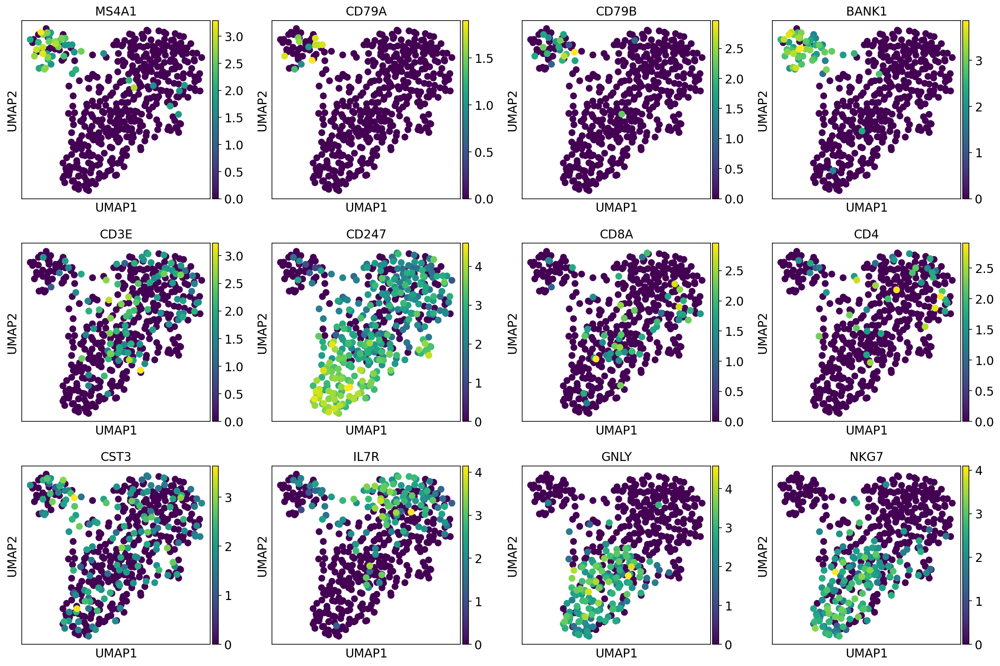

In [51]:
sc.pl.umap(subadata2, color=['MS4A1', 'CD79A', 'CD79B', "BANK1", 'CD3E', 'CD247', 'CD8A', 'CD4', 
                          'CST3', "IL7R",
                         'GNLY', 'NKG7'])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


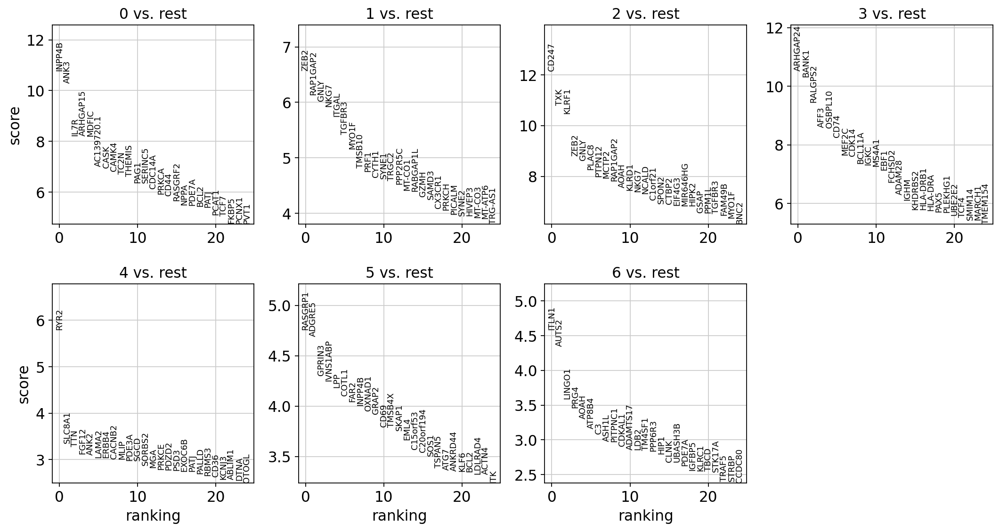

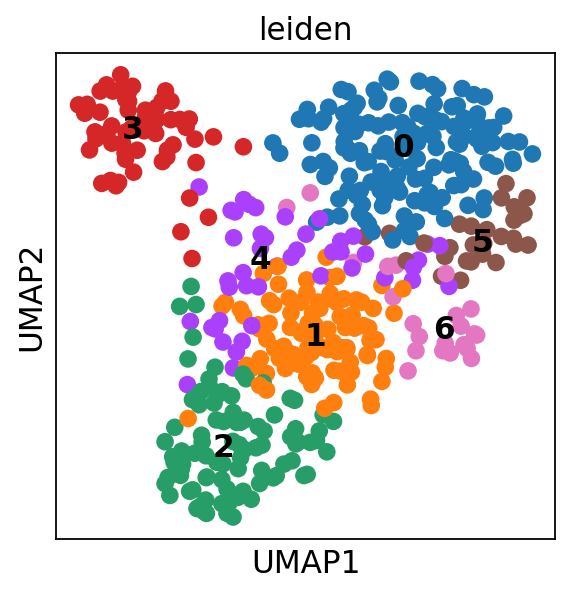

,0,1,2,3,4,5,6
0,INPP4B,ZEB2,CD247,ARHGAP24,RYR2,RASGRP1,ITLN1
1,ANK3,RAP1GAP2,TXK,BANK1,SLC8A1,ADGRE5,AUTS2
2,IL7R,GNLY,KLRF1,RALGPS2,TTN,GPRIN3,LINGO1
3,ARHGAP15,NKG7,ZEB2,AFF3,FGF12,IVNS1ABP,PRG4
4,MDFIC,ITGAL,GNLY,OSBPL10,ANK2,LPP,AOAH
5,AC139720.1,TGFBR3,PLAC8,CD74,LAMA2,COTL1,ATP8B4
6,CASK,MYO1F,PTPN12,MEF2C,ERBB4,FAR2,C3
7,CAMK4,TMSB10,MCTP2,CDK14,CACNB2,INPP4B,ASH1L
8,TC2N,PRF1,RAP1GAP2,BCL11A,MLIP,OXNAD1,PITPNC1
9,THEMIS,CYTH1,AOAH,IGKC,PDE3A,GRAP2,CDKAL1


In [47]:
sc.tl.rank_genes_groups(subadata2, 'leiden', method='wilcoxon', n_genes = 1000)
sc.pl.rank_genes_groups(subadata2, n_genes=25, sharey=False)

sc.pl.umap(subadata2, color = 'leiden', legend_loc = 'on data')

pd.DataFrame(subadata2.uns['rank_genes_groups']['names']).head(25)

/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


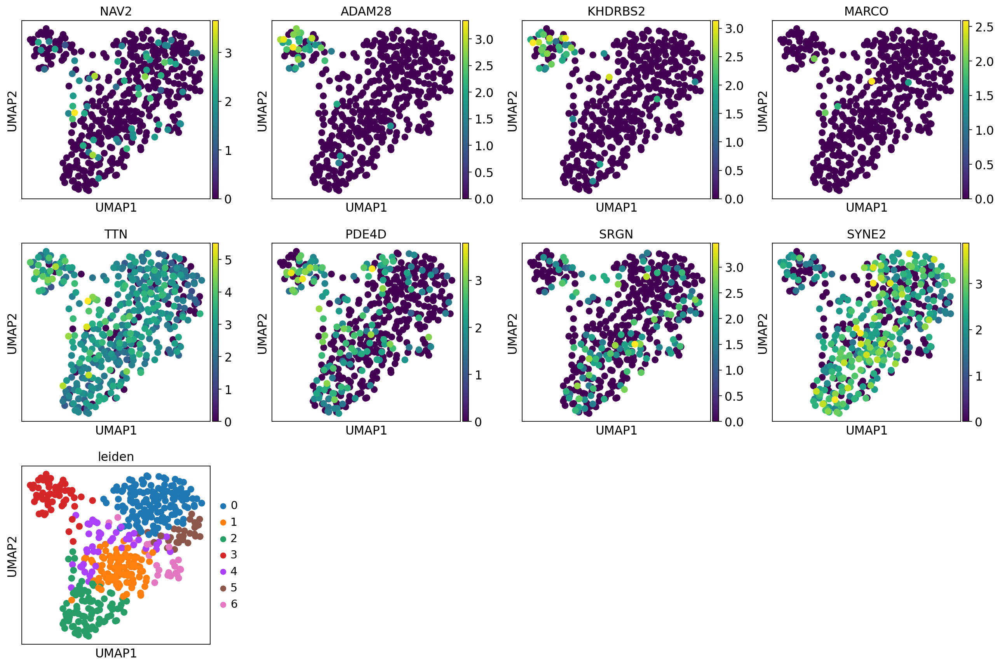

In [48]:
sc.pl.umap(subadata2, color = ["NAV2", "ADAM28", "KHDRBS2", "MARCO", "TTN", "PDE4D", "SRGN", "SYNE2", "leiden"])

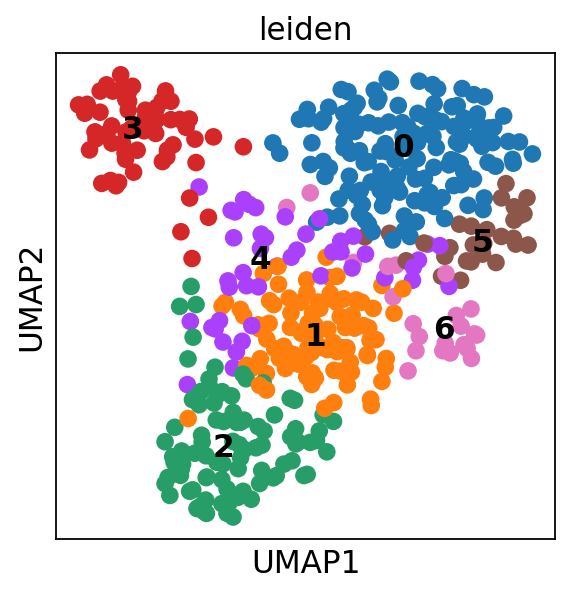

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns["dendrogram_['leiden']"]`


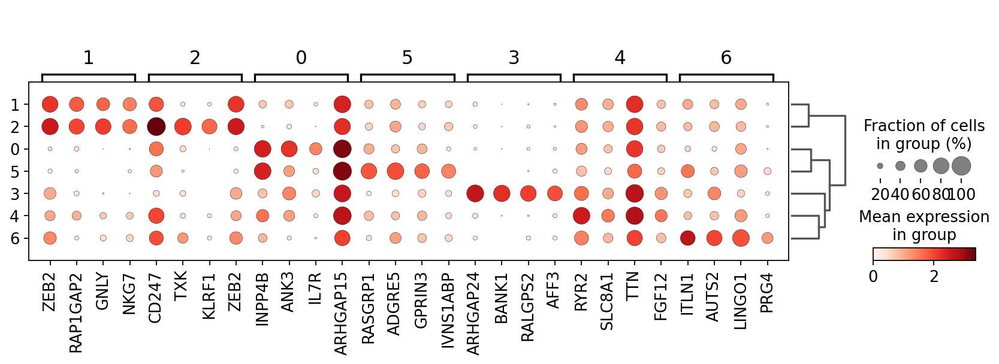

ranking genes


/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:08)


/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


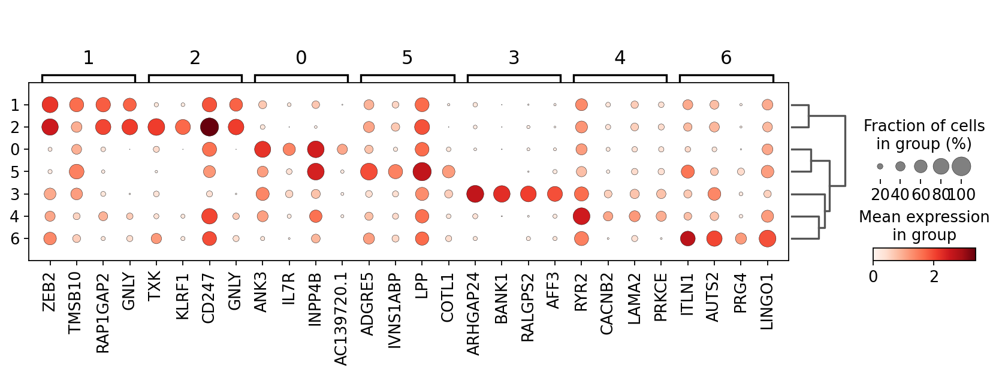

In [49]:
sc.pl.umap(subadata2, color = 'leiden', legend_loc = "on data")
sc.pl.rank_genes_groups_dotplot(subadata2, n_genes=4)
sc.tl.rank_genes_groups(subadata2, 'leiden', method='logreg', n_genes = 1000)
sc.pl.rank_genes_groups_dotplot(subadata2, n_genes=4)